If you have a magical power that allows you to teleport anywhere up to a km away, how many times would you need to use the power to get within back_radius?

In [386]:
import pandas as pd
import random
import matplotlib.pyplot as plt
import numpy as np

In [387]:
power_radius = 5
back_radius = 0.2
num_samples = 10000

In [388]:
def walk_in(cur_coords, back_radius, power_radius):
    #You have to go at least once
    iterations = 1
    angle = random.uniform(0, 2*np.pi)
    radius = random.uniform(0, power_radius)
    # Calculate the coordinates
    cur_coords[0] = radius * np.cos(angle)
    cur_coords[1] = radius * np.sin(angle)
    while np.sqrt(cur_coords[0]**2 + cur_coords[1]**2) > back_radius:
        iterations += 1
        angle = random.uniform(0, 2*np.pi)
        radius = random.uniform(0, power_radius)
        # Calculate the coordinates
        cur_coords[0] = radius * np.cos(angle)
        cur_coords[1] = radius * np.sin(angle)
        print(f"Iteration {iterations}: ({cur_coords[0]}, {cur_coords[1]}) - {np.sqrt(cur_coords[0]**2 + cur_coords[1]**2)}")
    return iterations

In [389]:
in_iters = []
out_iters = []
for i in range(num_samples):
    cur_coords = [0, 0]
    in_iter = walk_in(cur_coords, back_radius, power_radius)
    in_iters.append(in_iter)
    #print(f"Sample {i}: {in_iter} in, {out_iter} out")

0.40341249137060997
Iteration 2: (-1.1588760238793514, -1.0080833263282443) - 1.5359770934305734
Iteration 3: (0.30757121611274707, -1.7256757939229168) - 1.7528710730434693
Iteration 4: (-0.06149222895442188, 4.909205849775345) - 4.909590957471941
Iteration 5: (-0.4477412863996021, 1.47329936423547) - 1.5398322233942925
Iteration 6: (4.417846992635656, -1.2148703513897676) - 4.581842644725571
Iteration 7: (-2.714980580644063, 2.186628215125448) - 3.4860382247555854
Iteration 8: (1.5968741680899612, -1.6023991701672469) - 2.2622312457539984
Iteration 9: (-0.8174109809176003, 0.7229320832500834) - 1.0912339385837388
Iteration 10: (-2.1884268982187485, 2.145708643902111) - 3.0648454893132167
Iteration 11: (-2.1814345979255476, 0.43431059453832405) - 2.2242487715079955
Iteration 12: (-0.2329686030594483, 0.10427229391883275) - 0.25523926283110565
Iteration 13: (0.5465153133611593, 1.7996978625194286) - 1.8808485808526019
Iteration 14: (-3.524173930719738, 1.88144170135575) - 3.99494990826

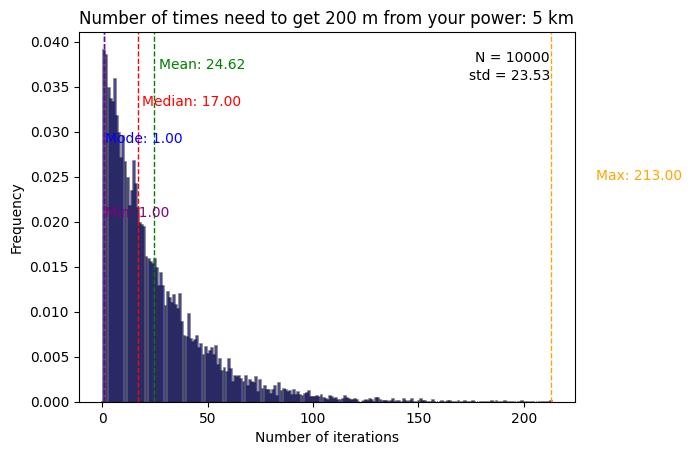

In [390]:
#Plot a histogram of the number of in_iters

#Custom bins dependent on unique values
bins = np.arange(0, max(in_iters) + 1.5) - 0.5
plt.hist(in_iters, bins=bins, density=True, rwidth=0.9, color='blue', alpha=0.5, edgecolor='black', linewidth=1.2)
plt.title(f"Number of times need to get {back_radius*1000:.0f} m from your power: {power_radius:.0f} km")
plt.xlabel("Number of iterations")
plt.ylabel("Frequency")
#Label the mean
plt.axvline(np.mean(in_iters), color='green', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(np.mean(in_iters)*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(np.mean(in_iters)), color='green')
#Label the median
plt.axvline(np.median(in_iters), color='red', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(np.median(in_iters)*1.1, max_ylim*0.8, 'Median: {:.2f}'.format(np.median(in_iters)), color='red' )
#Label the mode
plt.axvline(pd.Series(in_iters).mode()[0], color='blue', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(pd.Series(in_iters).mode()[0]*1.1, max_ylim*0.7, 'Mode: {:.2f}'.format(pd.Series(in_iters).mode()[0]), color='blue' )
#Label the max
plt.axvline(np.max(in_iters), color='orange', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(np.max(in_iters)*1.1, max_ylim*0.6, 'Max: {:.2f}'.format(np.max(in_iters)), color='orange' )
#Label the min
plt.axvline(np.min(in_iters), color='purple', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(np.min(in_iters)*1.1, max_ylim*0.5, 'Min: {:.2f}'.format(np.min(in_iters)), color='purple' )
#Label the standard deviation below the number of samples
plt.text(0.95, 0.90, f"std = {np.std(in_iters):.2f}", horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
#Label the number of samples - top right
plt.text(0.95, 0.95, f"N = {num_samples}", horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)

plt.show()

In [391]:
#Give 1-value stats
print(f"Mean: {np.mean(in_iters)}")
print(f"Min: {np.min(in_iters)}")
print(f"Q1: {np.percentile(in_iters, 25)}")
print(f"Median: {np.median(in_iters)}")
print(f"Q3: {np.percentile(in_iters, 75)}")
print(f"Max: {np.max(in_iters)}")
print(f"Std: {np.std(in_iters)}")
print(f"Variance: {np.var(in_iters)}")


Mean: 24.6151
Min: 1
Q1: 8.0
Median: 17.0
Q3: 34.0
Max: 213
Std: 23.529962855686794
Variance: 553.6591519900002
